# Chirundu Town Council CDF Approved and Unapproved Community Projects - 2022

## Purpose

This notebook extracts, cleans, validates and exports CDF community
project information published by Chirundu Town Council for 2022.

The objective is to preserve the useful information contained in the
source document, including both approved and unapproved community
projects.

Because the source PDF may contain scanned pages, OCR is used where
machine-readable text cannot be extracted directly.

In [1]:
import os
import pymupdf
import pytesseract
import pandas as pd
import cv2
import numpy as np

from PIL import Image
from IPython.display import display

pytesseract.pytesseract.tesseract_cmd = (
    r"C:\Program Files\Tesseract-OCR\tesseract.exe"
)

print("Libraries loaded successfully.")
print("Tesseract version:", pytesseract.get_tesseract_version())

Libraries loaded successfully.
Tesseract version: 5.4.0.20240606


## Source Document

The source document contains Chirundu Town Council CDF community
projects for 2022.

Unlike the approved-project-only dataset, this source may contain both
approved and unapproved projects.

The source table will first be inspected so that all useful fields are
identified before the final dataset structure is created.

In [2]:
raw_files = os.listdir("raw")

for file in raw_files:
    if "2022" in file:
        print(file)

2022-CDF-approved-projects.pdf
2022-CDF-Proposed-Community-Projects-.pdf


In [3]:
pdf_path = "raw/2022-CDF-Proposed-Community-Projects-.pdf"

print("File exists:", os.path.exists(pdf_path))

File exists: True


In [4]:
doc = pymupdf.open(pdf_path)

print("PDF opened successfully.")
print("Number of pages:", len(doc))

PDF opened successfully.
Number of pages: 2


## Direct Text Extraction Test

The notebook first checks whether the PDF contains machine-readable
text.

If useful text cannot be extracted directly, the pages will be
converted to images and processed using OCR.

In [5]:
for page_number, page in enumerate(doc):
    text = page.get_text().strip()

    print(
        f"Page {page_number + 1}:",
        len(text),
        "characters detected"
    )

Page 1: 10 characters detected
Page 2: 10 characters detected


## Page Rendering for OCR

Each page of the source document is converted to a high-resolution
image.

This allows the original tables to be visually inspected and provides
images that can be processed using Tesseract OCR.

In [6]:
os.makedirs(
    "notebooks/2022_proposed_ocr",
    exist_ok=True
)

image_paths = []

for i, page in enumerate(doc):
    matrix = pymupdf.Matrix(3, 3)

    pix = page.get_pixmap(
        matrix=matrix,
        alpha=False
    )

    image_path = (
        f"notebooks/2022_proposed_ocr/"
        f"2022_proposed_page{i + 1}.png"
    )

    pix.save(image_path)
    image_paths.append(image_path)

    print("Saved:", image_path)

Saved: notebooks/2022_proposed_ocr/2022_proposed_page1.png
Saved: notebooks/2022_proposed_ocr/2022_proposed_page2.png



PAGE 1


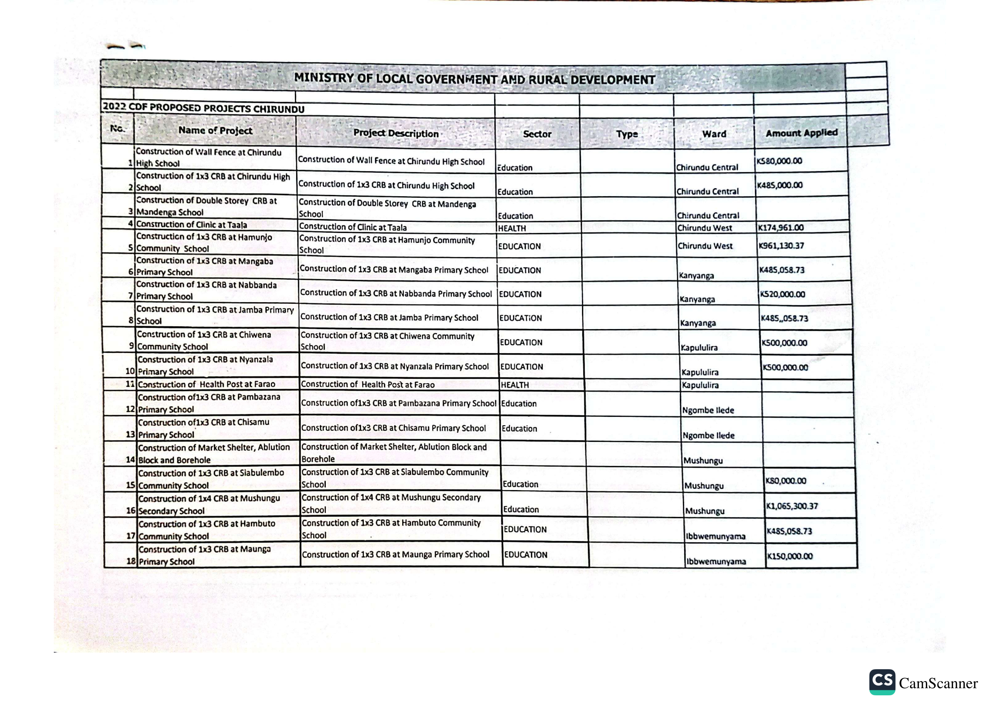


PAGE 2


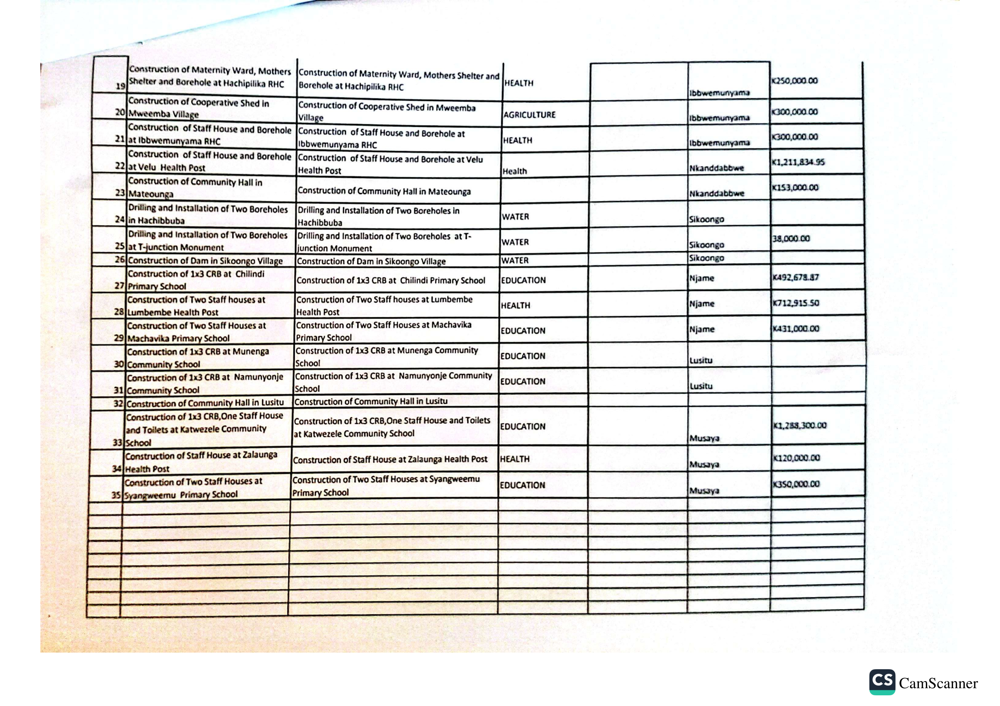

In [7]:
for i, image_path in enumerate(image_paths):
    print(f"\nPAGE {i + 1}")

    page_image = Image.open(image_path)
    display(page_image)

In [8]:
ocr_pages_2022 = []

for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path)

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )

    ocr_text = pytesseract.image_to_string(
        gray,
        lang="eng",
        config="--psm 6"
    )

    ocr_pages_2022.append(ocr_text)

    print(f"\n========== PAGE {i + 1} ==========\n")
    print(ocr_text)


========== PAGE 1 ==========

_——
‘tne. o) ose eee STE Tee = 4 7 . 8 . an Oe # 2
Es) MINISTRY OF LOCAL GOVERNMENT AMD RURAL DEVELOPMENT = |
2022 CDF PROPOSED PROJECTS CHIRUNDU (a ee Se
Re. | ©/) Name of Project |, “Project Description: “| sear | Type. - ward Areca See a
Construction of Wall Fence at Chirundu -
High School Construction of Wall Fence at Chirundu High School econ | chiciuncis csritral $20,000.00
Construction of 1x3 CRB at Chirundu High
| Construction of Double Storey CRB at Construction of Double Storey CRB at Mandenga
Mandenga School School Chirundu Central
|___4[ Construction of Clinic at Tala Construction of Clinic at Taala HEALTH [SSC Chirundu West _|k174,961.00
Constructicn of 1x3 CRB at Hamunjo Construction of 1x3 CRB at Hamunjo Community
zz Community School School EDUCATION became
‘Construction of 1x3 CRB at Mangaba
élerima Shan Construction of 1x3 CRB at Mangaba Primary Schcol |EDUCATION ; K48S,058.73
Construction of 1x3 CRB at Nabbanda :
7|Primary School Constru

In [10]:
ocr_text_2022 = ""

for i, text in enumerate(ocr_pages_2022):
    ocr_text_2022 += (
        f"\n========== PAGE {i + 1} ==========\n"
        + text
        + "\n"
    )

ocr_output_path = (
    "notebooks/2022_proposed_ocr/"
    "2022_proposed_ocr_raw.txt"
)

with open(
    ocr_output_path,
    "w",
    encoding="utf-8"
) as file:
    file.write(ocr_text_2022)

print("Raw OCR saved successfully:")
print(ocr_output_path)

Raw OCR saved successfully:
notebooks/2022_proposed_ocr/2022_proposed_ocr_raw.txt


## Source Table Structure

Initial inspection of the 2022 source document identified the following
project information:

- Project Name
- Project Description
- Sector
- Ward
- Amount

Additional contextual fields such as `year` will be added during
curation.

Approval status will only be assigned where it can be determined from
the source document.

In [11]:
for i, line in enumerate(ocr_text_2022.splitlines(), start=1):
    if line.strip():
        print(f"{i:03}: {line}")

002: ========== PAGE 1 ==========
003: _——
004: ‘tne. o) ose eee STE Tee = 4 7 . 8 . an Oe # 2
005: Es) MINISTRY OF LOCAL GOVERNMENT AMD RURAL DEVELOPMENT = |
006: 2022 CDF PROPOSED PROJECTS CHIRUNDU (a ee Se
007: Re. | ©/) Name of Project |, “Project Description: “| sear | Type. - ward Areca See a
008: Construction of Wall Fence at Chirundu -
009: High School Construction of Wall Fence at Chirundu High School econ | chiciuncis csritral $20,000.00
010: Construction of 1x3 CRB at Chirundu High
011: | Construction of Double Storey CRB at Construction of Double Storey CRB at Mandenga
012: Mandenga School School Chirundu Central
013: |___4[ Construction of Clinic at Tala Construction of Clinic at Taala HEALTH [SSC Chirundu West _|k174,961.00
014: Constructicn of 1x3 CRB at Hamunjo Construction of 1x3 CRB at Hamunjo Community
015: zz Community School School EDUCATION became
016: ‘Construction of 1x3 CRB at Mangaba
017: élerima Shan Construction of 1x3 CRB at Mangaba Primary Schcol |EDUCATIO

In [12]:
keywords = [
    "approved",
    "unapproved",
    "proposed",
    "deferred",
    "rejected",
    "status"
]

for keyword in keywords:
    print(f"\n--- {keyword.upper()} ---")

    for line in ocr_text_2022.splitlines():
        if keyword.lower() in line.lower():
            print(line)


--- APPROVED ---

--- UNAPPROVED ---

--- PROPOSED ---
2022 CDF PROPOSED PROJECTS CHIRUNDU (a ee Se

--- DEFERRED ---

--- REJECTED ---

--- STATUS ---


In [13]:
for line in ocr_text_2022.splitlines():
    if "K" in line or ".00" in line:
        print(line)

High School Construction of Wall Fence at Chirundu High School econ | chiciuncis csritral $20,000.00
|___4[ Construction of Clinic at Tala Construction of Clinic at Taala HEALTH [SSC Chirundu West _|k174,961.00
élerima Shan Construction of 1x3 CRB at Mangaba Primary Schcol |EDUCATION ; K48S,058.73
7|Primary School Construction of 1x3 CRB at Nabbanda Primary School [EDUCATION - «520,000.00
|g Community School School EQUCATION Kapululira 000.00
Construction of 1x3 CRB at Hambuto Construction of 1x3 CRB at Hambuto Community EDUCATION Ka8S,088.73
! Construction of Maternity Ward, Mothers {C K2SO,
ae ‘onstruction of Cooperative Shed In Construction of Cooperative Shed in Mweemba 300,000.00
a Construction of Staff House and Borehole [Construction of Staff House and Borehole at 200,000.00
Fal Construction of Staff House and Borehole [Construction of Staff House and Borehole at Velu K1,211,834.95
Construction of 1x3 CRB at Chilindi i i Iisme KA92,678.87
Construction of 1x3 CRB,One Staff House 

In [14]:
improved_ocr_pages = []

for i, image_path in enumerate(image_paths):

    image = cv2.imread(image_path)

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )

    # Improve contrast for the scanned table
    gray = cv2.GaussianBlur(gray, (3, 3), 0)

    threshold = cv2.threshold(
        gray,
        0,
        255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )[1]

    text = pytesseract.image_to_string(
        threshold,
        lang="eng",
        config="--psm 4"
    )

    improved_ocr_pages.append(text)

    print(f"\n========== IMPROVED PAGE {i + 1} ==========\n")
    print(text)


========== IMPROVED PAGE 1 ==========

rnsuuction of Wall Fence at Chirandu -
.00
coc of 1x3 CRB at Chirundu High
School

+e ante Se Te Giinic at Taala Construction of Clinic at Taala HEALTH

Constructicn of 1x3 CRB at Hamunjo Construction of 1x3 CRB at Hamunjo Community a a ae
Community Schoo! School
‘Construction of 1x3 CRB at Mangaba c
blo School ‘onstruction of 1x3 CRB at Mangaba Primary Schco! [EDUCATION °
Construction of 123 CRB at Nabbanda
[eeesag nn feomestncnninier wan [ Lage
Construction of 1: Pri
a ad
Construction of 1x3 CRB at Chiwena Construction of 1x3 CRB at Chiwena Community | ——_fenato_foonnn_|
Communit School School
10] Primary School

| __ 13] Construction of Health Post at Farao Construction of Health Post at Farao

‘onstruction of 1x3 CRB at Pambazana
Construction of 1x3 CRB at Chisamu
son of Market Shelter, Ablution [Construction of Market Shelter, Ablution Block and Fs
Block and Borehole Borehole
Construction of 1x3 CRB at Slabulembo —_‘ [Construction of 1x3 CR6

## Manual Verification and Data Curation

The OCR output was compared with the original scanned PDF because the
table structure caused some OCR values to become merged or incorrectly
recognised.

The source document contains the following fields:

- No.
- Name of Project
- Project Description
- Sector
- Type
- Ward
- Amount Applied

The source contains 35 proposed community projects across two pages.

Values that are blank in the original source are retained as missing
values rather than inferred.

The `year` field is added from the document title, which identifies the
records as 2022 CDF proposed projects.

In [16]:
projects_2022_proposed = [
    {
        "no": 1,
        "project_name": "Construction of Wall Fence at Chirundu High School",
        "project_description": "Construction of Wall Fence at Chirundu High School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu Central",
        "amount_applied": "K580,000.00"
    },
    {
        "no": 2,
        "project_name": "Construction of 1x3 CRB at Chirundu High School",
        "project_description": "Construction of 1x3 CRB at Chirundu High School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu Central",
        "amount_applied": "K485,000.00"
    },
    {
        "no": 3,
        "project_name": "Construction of Double Storey CRB at Mandenga School",
        "project_description": "Construction of Double Storey CRB at Mandenga School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu Central",
        "amount_applied": None
    },
    {
        "no": 4,
        "project_name": "Construction of Clinic at Taala",
        "project_description": "Construction of Clinic at Taala",
        "sector": "Health",
        "type": None,
        "ward": "Chirundu West",
        "amount_applied": "K174,561.00"
    },
    {
        "no": 5,
        "project_name": "Construction of 1x3 CRB at Hamunjo Community School",
        "project_description": "Construction of 1x3 CRB at Hamunjo Community School",
        "sector": "Education",
        "type": None,
        "ward": "Chirundu West",
        "amount_applied": "K961,130.37"
    },
    {
        "no": 6,
        "project_name": "Construction of 1x3 CRB at Mangaba Primary School",
        "project_description": "Construction of 1x3 CRB at Mangaba Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kanyanga",
        "amount_applied": "K485,058.73"
    },
    {
        "no": 7,
        "project_name": "Construction of 1x3 CRB at Nabbanda Primary School",
        "project_description": "Construction of 1x3 CRB at Nabbanda Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kanyanga",
        "amount_applied": "K520,000.00"
    },
    {
        "no": 8,
        "project_name": "Construction of 1x3 CRB at Jamba Primary School",
        "project_description": "Construction of 1x3 CRB at Jamba Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kanyanga",
        "amount_applied": "K485,058.73"
    },
    {
        "no": 9,
        "project_name": "Construction of 1x3 CRB at Chiwena Community School",
        "project_description": "Construction of 1x3 CRB at Chiwena Community School",
        "sector": "Education",
        "type": None,
        "ward": "Kapululira",
        "amount_applied": "K500,000.00"
    },
    {
        "no": 10,
        "project_name": "Construction of 1x3 CRB at Nyanzala Primary School",
        "project_description": "Construction of 1x3 CRB at Nyanzala Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Kapululira",
        "amount_applied": "K500,000.00"
    },
    {
        "no": 11,
        "project_name": "Construction of Health Post at Farao",
        "project_description": "Construction of Health Post at Farao",
        "sector": "Health",
        "type": None,
        "ward": "Kapululira",
        "amount_applied": None
    },
    {
        "no": 12,
        "project_name": "Construction of 1x3 CRB at Pambazana Primary School",
        "project_description": "Construction of 1x3 CRB at Pambazana Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Ngombe Ilede",
        "amount_applied": None
    },
    {
        "no": 13,
        "project_name": "Construction of 1x3 CRB at Chisamu Primary School",
        "project_description": "Construction of 1x3 CRB at Chisamu Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Ngombe Ilede",
        "amount_applied": None
    },
    {
        "no": 14,
        "project_name": "Construction of Market Shelter, Ablution Block and Borehole",
        "project_description": "Construction of Market Shelter, Ablution Block and Borehole",
        "sector": None,
        "type": None,
        "ward": "Mushungu",
        "amount_applied": None
    },
    {
        "no": 15,
        "project_name": "Construction of 1x3 CRB at Siabulembo Community School",
        "project_description": "Construction of 1x3 CRB at Siabulembo Community School",
        "sector": "Education",
        "type": None,
        "ward": "Mushungu",
        "amount_applied": "K50,000.00"
    },
    {
        "no": 16,
        "project_name": "Construction of 1x4 CRB at Mushungu Secondary School",
        "project_description": "Construction of 1x4 CRB at Mushungu Secondary School",
        "sector": "Education",
        "type": None,
        "ward": "Mushungu",
        "amount_applied": "K1,065,300.37"
    },
    {
        "no": 17,
        "project_name": "Construction of 1x3 CRB at Hambuto Community School",
        "project_description": "Construction of 1x3 CRB at Hambuto Community School",
        "sector": "Education",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K485,058.73"
    },
    {
        "no": 18,
        "project_name": "Construction of 1x3 CRB at Maunga Primary School",
        "project_description": "Construction of 1x3 CRB at Maunga Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K150,000.00"
    },
    {
        "no": 19,
        "project_name": "Construction of Maternity Ward, Mothers Shelter and Borehole at Hachipilika RHC",
        "project_description": "Construction of Maternity Ward, Mothers Shelter and Borehole at Hachipilika RHC",
        "sector": "Health",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K650,000.00"
    },
    {
        "no": 20,
        "project_name": "Construction of Cooperative Shed in Mweemba Village",
        "project_description": "Construction of Cooperative Shed in Mweemba Village",
        "sector": "Agriculture",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K600,000.00"
    },
    {
        "no": 21,
        "project_name": "Construction of Staff House and Borehole at Ibbwemunyama RHC",
        "project_description": "Construction of Staff House and Borehole at Ibbwemunyama RHC",
        "sector": "Health",
        "type": None,
        "ward": "Ibbwemunyama",
        "amount_applied": "K600,000.00"
    },
    {
        "no": 22,
        "project_name": "Construction of Staff House and Borehole at Velu Health Post",
        "project_description": "Construction of Staff House and Borehole at Velu Health Post",
        "sector": "Health",
        "type": None,
        "ward": "Nkandabbwe",
        "amount_applied": "K1,211,834.95"
    },
    {
        "no": 23,
        "project_name": "Construction of Community Hall in Mateounga",
        "project_description": "Construction of Community Hall in Mateounga",
        "sector": None,
        "type": None,
        "ward": "Nkandabbwe",
        "amount_applied": "K153,000.00"
    },
    {
        "no": 24,
        "project_name": "Drilling and Installation of Two Boreholes in Hachibbuba",
        "project_description": "Drilling and Installation of Two Boreholes in Hachibbuba",
        "sector": "Water",
        "type": None,
        "ward": "Sikoongo",
        "amount_applied": None
    },
    {
        "no": 25,
        "project_name": "Drilling and Installation of Two Boreholes at T-Junction Monument",
        "project_description": "Drilling and Installation of Two Boreholes at T-Junction Monument",
        "sector": "Water",
        "type": None,
        "ward": "Sikoongo",
        "amount_applied": "K38,000.00"
    },
    {
        "no": 26,
        "project_name": "Construction of Dam in Sikoongo Village",
        "project_description": "Construction of Dam in Sikoongo Village",
        "sector": "Water",
        "type": None,
        "ward": "Sikoongo",
        "amount_applied": None
    },
    {
        "no": 27,
        "project_name": "Construction of 1x3 CRB at Chilindi Primary School",
        "project_description": "Construction of 1x3 CRB at Chilindi Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Njame",
        "amount_applied": "K492,678.87"
    },
    {
        "no": 28,
        "project_name": "Construction of Two Staff Houses at Lumbembe Health Post",
        "project_description": "Construction of Two Staff Houses at Lumbembe Health Post",
        "sector": "Health",
        "type": None,
        "ward": "Njame",
        "amount_applied": "K712,915.50"
    },
    {
        "no": 29,
        "project_name": "Construction of Two Staff Houses at Machavika Primary School",
        "project_description": "Construction of Two Staff Houses at Machavika Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Njame",
        "amount_applied": "K431,000.00"
    },
    {
        "no": 30,
        "project_name": "Construction of 1x3 CRB at Munenga Community School",
        "project_description": "Construction of 1x3 CRB at Munenga Community School",
        "sector": "Education",
        "type": None,
        "ward": "Lusitu",
        "amount_applied": None
    },
    {
        "no": 31,
        "project_name": "Construction of 1x3 CRB at Namunyonje Community School",
        "project_description": "Construction of 1x3 CRB at Namunyonje Community School",
        "sector": "Education",
        "type": None,
        "ward": "Lusitu",
        "amount_applied": None
    },
    {
        "no": 32,
        "project_name": "Construction of Community Hall in Lusitu",
        "project_description": "Construction of Community Hall in Lusitu",
        "sector": None,
        "type": None,
        "ward": "Lusitu",
        "amount_applied": None
    },
    {
        "no": 33,
        "project_name": "Construction of 1x3 CRB, One Staff House and Toilets at Katwezele Community School",
        "project_description": "Construction of 1x3 CRB, One Staff House and Toilets at Katwezele Community School",
        "sector": "Education",
        "type": None,
        "ward": "Musaya",
        "amount_applied": "K1,283,300.00"
    },
    {
        "no": 34,
        "project_name": "Construction of Staff House at Zalaunga Health Post",
        "project_description": "Construction of Staff House at Zalaunga Health Post",
        "sector": "Health",
        "type": None,
        "ward": "Musaya",
        "amount_applied": "K120,000.00"
    },
    {
        "no": 35,
        "project_name": "Construction of Two Staff Houses at Syangweemu Primary School",
        "project_description": "Construction of Two Staff Houses at Syangweemu Primary School",
        "sector": "Education",
        "type": None,
        "ward": "Musaya",
        "amount_applied": "K850,000.00"
    }
]

df_2022_proposed = pd.DataFrame(projects_2022_proposed)

df_2022_proposed["year"] = 2022

df_2022_proposed.head()

,no,project_name,project_description,sector,type,ward,amount_applied,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,None,Chirundu Central,"K580,000.00",2022
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,None,Chirundu Central,"K485,000.00",2022
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,None,Chirundu Central,NaN,2022
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,None,Chirundu West,"K174,561.00",2022
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,None,Chirundu West,"K961,130.37",2022


In [17]:
print("Shape:", df_2022_proposed.shape)

display(df_2022_proposed)

print("\nColumns:")
print(df_2022_proposed.columns.tolist())

Shape: (35, 8)


,no,project_name,project_description,sector,type,ward,amount_applied,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,None,Chirundu Central,"K580,000.00",2022
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,None,Chirundu Central,"K485,000.00",2022
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,None,Chirundu Central,NaN,2022
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,None,Chirundu West,"K174,561.00",2022
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,None,Chirundu West,"K961,130.37",2022
5,6,Construction of 1x3 CRB at Mangaba Primary School,Construction of 1x3 CRB at Mangaba Primary School,Education,None,Kanyanga,"K485,058.73",2022
6,7,Construction of 1x3 CRB at Nabbanda Primary Sc...,Construction of 1x3 CRB at Nabbanda Primary Sc...,Education,None,Kanyanga,"K520,000.00",2022
7,8,Construction of 1x3 CRB at Jamba Primary School,Construction of 1x3 CRB at Jamba Primary School,Education,None,Kanyanga,"K485,058.73",2022
8,9,Construction of 1x3 CRB at Chiwena Community S...,Construction of 1x3 CRB at Chiwena Community S...,Education,None,Kapululira,"K500,000.00",2022
9,10,Construction of 1x3 CRB at Nyanzala Primary Sc...,Construction of 1x3 CRB at Nyanzala Primary Sc...,Education,None,Kapululira,"K500,000.00",2022



Columns:
['no', 'project_name', 'project_description', 'sector', 'type', 'ward', 'amount_applied', 'year']


In [18]:
print("Number of records:", len(df_2022_proposed))

print("\nMissing values:")
print(df_2022_proposed.isna().sum())

print("\nDuplicate rows:")
print(df_2022_proposed.duplicated().sum())

print("\nYear values:")
print(df_2022_proposed["year"].value_counts())

print("\nWards:")
print(df_2022_proposed["ward"].value_counts())

print("\nSectors:")
print(df_2022_proposed["sector"].value_counts(dropna=False))

Number of records: 35

Missing values:
no                      0
project_name            0
project_description     0
sector                  3
type                   35
ward                    0
amount_applied         10
year                    0
dtype: int64

Duplicate rows:
0

Year values:
year
2022    35
Name: count, dtype: int64

Wards:
ward
Ibbwemunyama        5
Chirundu Central    3
Kanyanga            3
Kapululira          3
Mushungu            3
Sikoongo            3
Njame               3
Lusitu              3
Musaya              3
Chirundu West       2
Ngombe Ilede        2
Nkandabbwe          2
Name: count, dtype: int64

Sectors:
sector
Education      21
Health          7
NaN             3
Water           3
Agriculture     1
Name: count, dtype: int64


In [19]:
df_2022_proposed["amount_applied_zmw"] = (
    df_2022_proposed["amount_applied"]
    .str.replace("K", "", regex=False)
    .str.replace(",", "", regex=False)
    .astype(float)
)

df_2022_proposed[
    ["amount_applied", "amount_applied_zmw"]
].head(10)

,amount_applied,amount_applied_zmw
0,"K580,000.00",580000.00
1,"K485,000.00",485000.00
2,NaN,NaN
3,"K174,561.00",174561.00
4,"K961,130.37",961130.37
5,"K485,058.73",485058.73
6,"K520,000.00",520000.00
7,"K485,058.73",485058.73
8,"K500,000.00",500000.00
9,"K500,000.00",500000.00


## Data Validation

The cleaned dataset was validated against the original two-page source
document.

A total of 35 project records were identified.

Blank values in the source document were retained as missing values.
No sector, type or financial amount was inferred where the original
table did not provide one.

The original `amount_applied` field was retained for source fidelity,
while `amount_applied_zmw` was created as a numeric representation to
make the financial data suitable for analysis.

The year 2022 was derived from the title of the source document.

In [20]:
final_columns = [
    "no",
    "project_name",
    "project_description",
    "sector",
    "type",
    "ward",
    "amount_applied",
    "amount_applied_zmw",
    "year"
]

df_2022_proposed = df_2022_proposed[final_columns]

display(df_2022_proposed.head())

,no,project_name,project_description,sector,type,ward,amount_applied,amount_applied_zmw,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,None,Chirundu Central,"K580,000.00",580000.00,2022
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,None,Chirundu Central,"K485,000.00",485000.00,2022
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,None,Chirundu Central,NaN,NaN,2022
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,None,Chirundu West,"K174,561.00",174561.00,2022
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,None,Chirundu West,"K961,130.37",961130.37,2022


In [21]:
os.makedirs("processed", exist_ok=True)

output_path = (
    "processed/"
    "db-unza26-csc4792-chirundu_cdf_proposed_projects_2022.csv"
)

df_2022_proposed.to_csv(
    output_path,
    sep="|",
    index=False,
    encoding="utf-8"
)

print("CSV exported successfully:")
print(output_path)

CSV exported successfully:
processed/db-unza26-csc4792-chirundu_cdf_proposed_projects_2022.csv


In [22]:
check_df = pd.read_csv(
    output_path,
    sep="|"
)

print("Rows:", len(check_df))
print("Columns:", len(check_df.columns))
print("Duplicates:", check_df.duplicated().sum())

display(check_df.head())

Rows: 35
Columns: 9
Duplicates: 0


,no,project_name,project_description,sector,type,ward,amount_applied,amount_applied_zmw,year
0,1,Construction of Wall Fence at Chirundu High Sc...,Construction of Wall Fence at Chirundu High Sc...,Education,NaN,Chirundu Central,"K580,000.00",580000.00,2022
1,2,Construction of 1x3 CRB at Chirundu High School,Construction of 1x3 CRB at Chirundu High School,Education,NaN,Chirundu Central,"K485,000.00",485000.00,2022
2,3,Construction of Double Storey CRB at Mandenga ...,Construction of Double Storey CRB at Mandenga ...,Education,NaN,Chirundu Central,NaN,NaN,2022
3,4,Construction of Clinic at Taala,Construction of Clinic at Taala,Health,NaN,Chirundu West,"K174,561.00",174561.00,2022
4,5,Construction of 1x3 CRB at Hamunjo Community S...,Construction of 1x3 CRB at Hamunjo Community S...,Education,NaN,Chirundu West,"K961,130.37",961130.37,2022


In [23]:
with open(output_path, "r", encoding="utf-8") as file:
    print(file.readline())

no|project_name|project_description|sector|type|ward|amount_applied|amount_applied_zmw|year



## Conclusion

The 2022 Chirundu Town Council CDF Proposed Projects document was
processed successfully.

The source consisted of two scanned pages containing 35 community
project records. OCR was used to assist extraction, followed by manual
verification against the original scanned tables.

The cleaned dataset preserves the original project name, project
description, sector, type, ward and amount applied fields. Blank source
values were retained as missing values rather than inferred.

A numeric Zambian Kwacha amount field was additionally generated for
analysis, and the year was derived from the document title.

The final dataset was exported as a pipe-separated CSV file in
accordance with the CSC 4792 assignment requirements.